In [1]:
!wget https://dl.dropboxusercontent.com/s/h8a8kev0rktf4kq/dataset-sample.tar.gz

--2020-05-07 21:21:27--  https://dl.dropboxusercontent.com/s/h8a8kev0rktf4kq/dataset-sample.tar.gz
Resolving dl.dropboxusercontent.com (dl.dropboxusercontent.com)... 162.125.82.6, 2620:100:6032:6::a27d:5206
Connecting to dl.dropboxusercontent.com (dl.dropboxusercontent.com)|162.125.82.6|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 418980035 (400M) [application/octet-stream]
Saving to: ‘dataset-sample.tar.gz’

dataset-sample.tar. 100%[===================>] 399.57M  47.2MB/s    in 9.8s    

2020-05-07 21:21:38 (40.8 MB/s) - ‘dataset-sample.tar.gz’ saved [418980035/418980035]



In [2]:
%ls

dataset-sample.tar.gz  sample_data/


In [3]:
!tar -xzvf dataset-sample.tar.gz

dataset-sample/
dataset-sample/elevations/
dataset-sample/elevations/e1d3e6f6ba_B4DE0FB544INSPIRE-elev.tif
dataset-sample/elevations/ec09336a6f_06BA0AF311OPENPIPELINE-elev.tif
dataset-sample/elevations/1d4fbe33f3_F1BE1D4184INSPIRE-elev.tif
dataset-sample/images/
dataset-sample/images/1d4fbe33f3_F1BE1D4184INSPIRE-ortho.tif
dataset-sample/images/ec09336a6f_06BA0AF311OPENPIPELINE-ortho.tif
dataset-sample/images/e1d3e6f6ba_B4DE0FB544INSPIRE-ortho.tif
dataset-sample/index.csv
dataset-sample/labels/
dataset-sample/labels/ec09336a6f_06BA0AF311OPENPIPELINE-label.png
dataset-sample/labels/1d4fbe33f3_F1BE1D4184INSPIRE-label.png
dataset-sample/labels/e1d3e6f6ba_B4DE0FB544INSPIRE-label.png


In [4]:
%ls

dataset-sample/  dataset-sample.tar.gz  sample_data/


In [7]:

%cd dataset-sample/

/content/dataset-sample


In [8]:
!find

.
./labels
./labels/1d4fbe33f3_F1BE1D4184INSPIRE-label.png
./labels/e1d3e6f6ba_B4DE0FB544INSPIRE-label.png
./labels/ec09336a6f_06BA0AF311OPENPIPELINE-label.png
./index.csv
./images
./images/ec09336a6f_06BA0AF311OPENPIPELINE-ortho.tif
./images/e1d3e6f6ba_B4DE0FB544INSPIRE-ortho.tif
./images/1d4fbe33f3_F1BE1D4184INSPIRE-ortho.tif
./elevations
./elevations/1d4fbe33f3_F1BE1D4184INSPIRE-elev.tif
./elevations/e1d3e6f6ba_B4DE0FB544INSPIRE-elev.tif
./elevations/ec09336a6f_06BA0AF311OPENPIPELINE-elev.tif


In [0]:
import pandas as pd
imageInfo = pd.read_csv('index.csv', sep=' ') # we can set the space ' ' as the seperation

In [10]:
imageInfo.shape

(3, 12)

In [11]:
print(imageInfo)

  status                               name  ...  percentage_car  percentage_ignore
0   GOOD       1d4fbe33f3_F1BE1D4184INSPIRE  ...            0.09              18.08
1   GOOD       e1d3e6f6ba_B4DE0FB544INSPIRE  ...            0.12              46.47
2   GOOD  ec09336a6f_06BA0AF311OPENPIPELINE  ...            0.17              31.71

[3 rows x 12 columns]


In [12]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None
pd.options.display.width= 1000

print(imageInfo)

  status                               name  rows  cols  visible_classes  percentage_building  percentage_clutter  percentage_vegetation  percentage_water  percentage_ground  percentage_car  percentage_ignore
0   GOOD       1d4fbe33f3_F1BE1D4184INSPIRE  5542  2962                7                21.52                0.41                  15.42              1.63              42.85            0.09              18.08
1   GOOD       e1d3e6f6ba_B4DE0FB544INSPIRE  8408  5924                7                 3.43                1.10                   4.44              1.51              42.94            0.12              46.47
2   GOOD  ec09336a6f_06BA0AF311OPENPIPELINE  4968  7262                6                 2.93                1.29                  22.26              0.00              41.65            0.17              31.71


In [13]:
print(imageInfo.T)

                                                  0                             1                                  2
status                                         GOOD                          GOOD                               GOOD
name                   1d4fbe33f3_F1BE1D4184INSPIRE  e1d3e6f6ba_B4DE0FB544INSPIRE  ec09336a6f_06BA0AF311OPENPIPELINE
rows                                           5542                          8408                               4968
cols                                           2962                          5924                               7262
visible_classes                                   7                             7                                  6
percentage_building                           21.52                          3.43                               2.93
percentage_clutter                             0.41                           1.1                               1.29
percentage_vegetation                         15.42             

In [14]:
imageInfo['path_image'] = './images/'+imageInfo['name']+'-ortho.tif' 
imageInfo['path_elevation'] = './elevations/'+imageInfo['name']+'-elev.tif'
imageInfo['path_label'] = './labels/'+imageInfo['name']+'-label.png'

print(imageInfo.T)

                                                                       0                                                  1                                                  2
status                                                              GOOD                                               GOOD                                               GOOD
name                                        1d4fbe33f3_F1BE1D4184INSPIRE                       e1d3e6f6ba_B4DE0FB544INSPIRE                  ec09336a6f_06BA0AF311OPENPIPELINE
rows                                                                5542                                               8408                                               4968
cols                                                                2962                                               5924                                               7262
visible_classes                                                        7                                                  7  

In [15]:
imageInfo0 = imageInfo.iloc[0]
print(imageInfo0['path_image'])
print(imageInfo.iloc[0].path_image)

print(imageInfo0['path_label'])
print(imageInfo.iloc[0].path_label)

./images/1d4fbe33f3_F1BE1D4184INSPIRE-ortho.tif
./images/1d4fbe33f3_F1BE1D4184INSPIRE-ortho.tif
./labels/1d4fbe33f3_F1BE1D4184INSPIRE-label.png
./labels/1d4fbe33f3_F1BE1D4184INSPIRE-label.png


In [16]:
for index, row in imageInfo.iterrows():
  print(index, row[['name','visible_classes']])


0 name               1d4fbe33f3_F1BE1D4184INSPIRE
visible_classes                               7
Name: 0, dtype: object
1 name               e1d3e6f6ba_B4DE0FB544INSPIRE
visible_classes                               7
Name: 1, dtype: object
2 name               ec09336a6f_06BA0AF311OPENPIPELINE
visible_classes                                    6
Name: 2, dtype: object


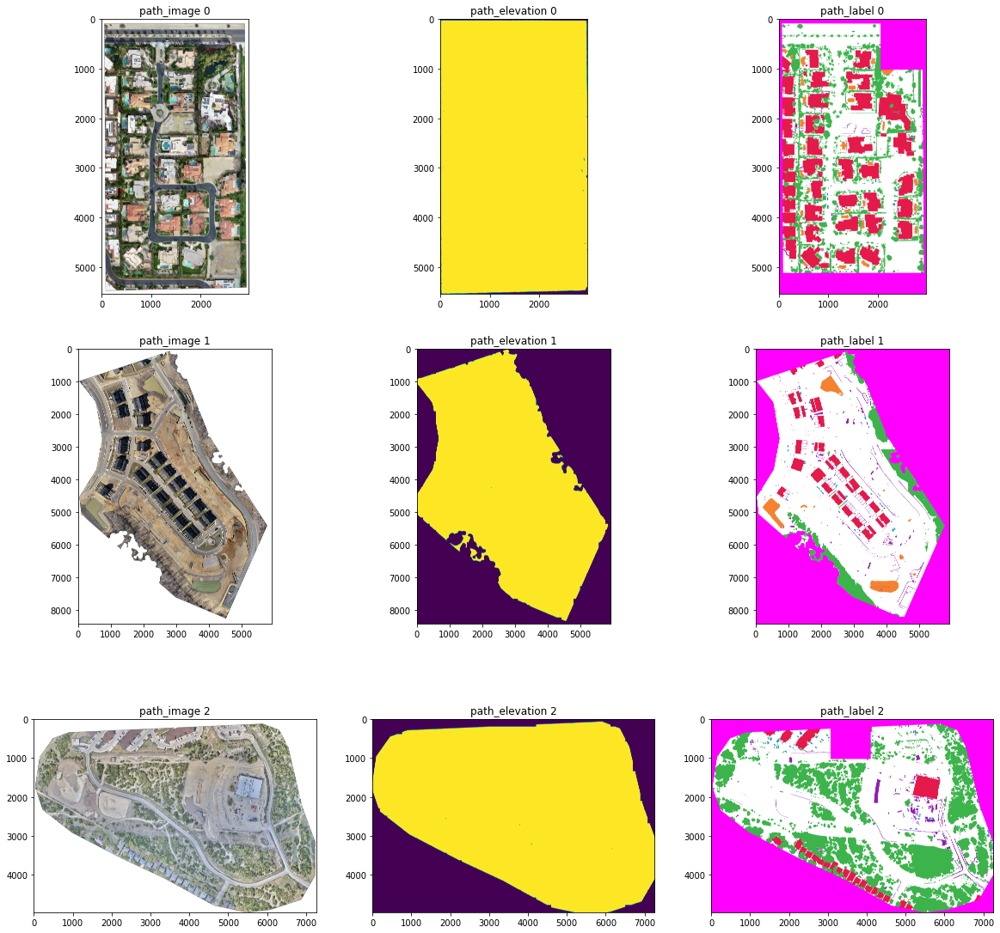

In [17]:
import imageio
from matplotlib import pyplot as plt

import warnings
warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = [20, 20]

image_types = ['path_image','path_elevation','path_label']
image_type_count = len(image_types)
image_set_count = imageInfo.shape[0]

fig, axs = plt.subplots(image_set_count, image_type_count)
for index, row in imageInfo.iterrows():
  figure_column = 0
  for image_type in image_types:
    axs[index,figure_column].imshow(imageio.imread(row[image_type])) 
    axs[index,figure_column].set_title(image_type+' '+str(index))
    figure_column += 1

Text(0.5, 1.0, 'the blue channel alone')

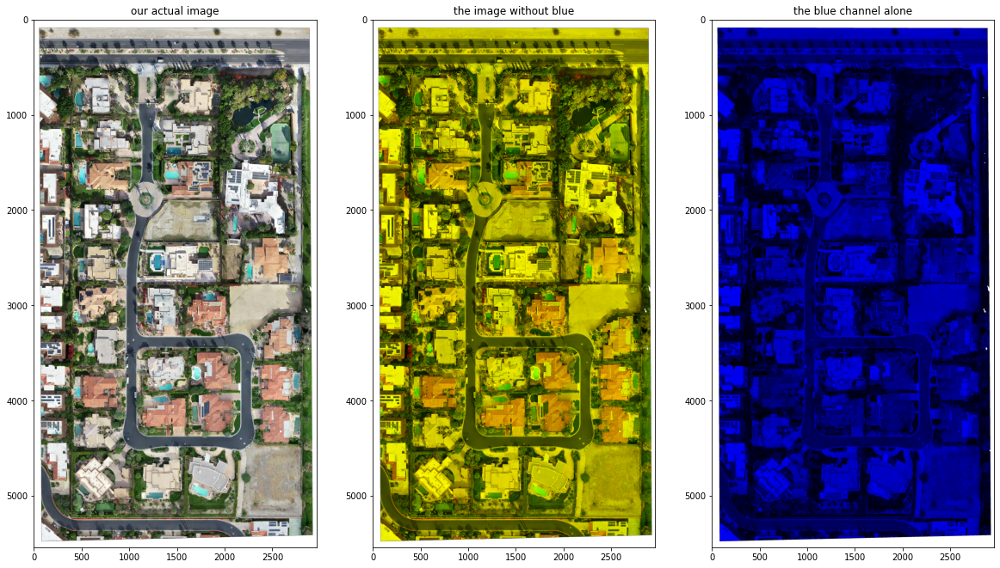

In [18]:
imageRGB = imageio.imread(imageInfo.iloc[0].path_image)
imageRG = imageRGB.copy()
imageRG[:,:,2] = 0 
imageB = imageRGB.copy()
imageB[:,:,0:2] = 0 

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGB);axs[0].set_title('our actual image')
axs[1].imshow(imageRG);axs[1].set_title('the image without blue')
axs[2].imshow(imageB);axs[2].set_title('the blue channel alone')

In [19]:
imageRGB = imageio.imread(imageInfo.iloc[0].path_image)
print(imageRGB.shape)
imageRGB_flat = imageRGB.reshape(-1, imageRGB.shape[-1])
print(imageRGB_flat.shape)

(5542, 2962, 4)
(16415404, 4)


In [0]:
imageRG_flat = imageRGB_flat[:,0:2]
imageB_flat = imageRGB_flat[:,2]

In [0]:
imageRG_flat_subsample = imageRG_flat[::100]
imageB_flat_subsample = imageB_flat[::100]

In [22]:
print(imageRG_flat_subsample.shape)
print(imageB_flat_subsample.shape)

(164155, 2)
(164155,)


In [23]:
from sklearn.ensemble import GradientBoostingRegressor
blueModel = GradientBoostingRegressor(n_estimators=100, learning_rate=1,
                                      max_depth=1, random_state=0, loss='huber', verbose=1).fit(imageRG_flat_subsample, imageB_flat_subsample)

      Iter       Train Loss   Remaining Time 
         1         783.2377            6.22s
         2         555.6822            6.59s
         3         474.3631            6.34s
         4         386.4598            6.26s
         5         332.1460            6.21s
         6         309.2735            6.07s
         7         281.7053            5.97s
         8         266.1851            5.91s
         9         256.6886            5.83s
        10         245.0302            5.75s
        20         204.6582            5.18s
        30         186.5296            4.57s
        40         178.6180            3.93s
        50         171.8837            3.28s
        60         166.9794            2.65s
        70         163.8827            1.99s
        80         161.3088            1.33s
        90         159.4628            0.67s
       100         158.2026            0.00s


In [0]:
imageB_flat_model = blueModel.predict(imageRG_flat)

inshape = imageRGB.shape
imageB_model = imageB_flat_model.reshape(inshape[0:2])

Text(0.5, 1.0, 'the difference between')

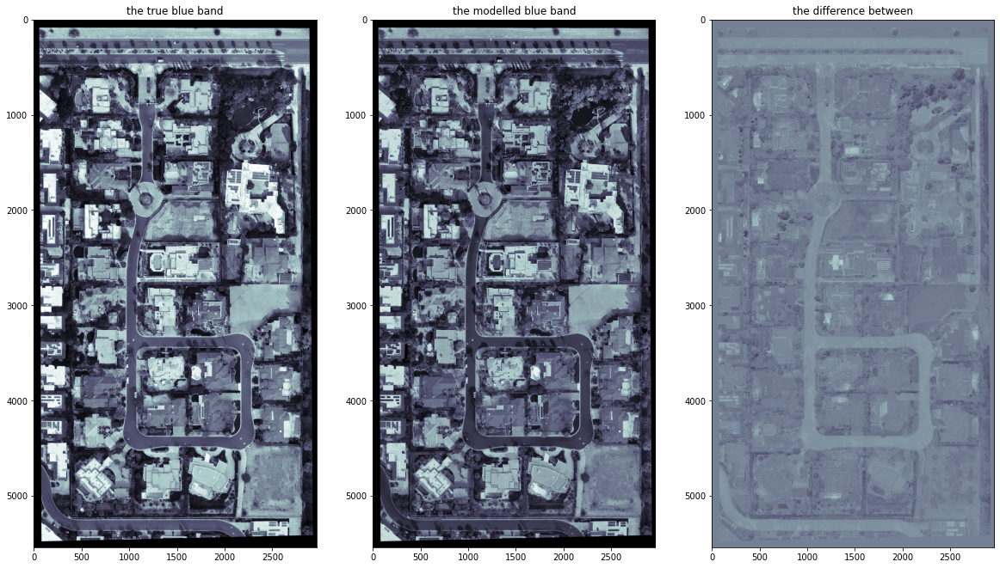

In [25]:
imageB_band = imageB[:,:,2]

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageB_band, cmap='bone');axs[0].set_title('the true blue band')
axs[1].imshow(imageB_model, cmap='bone');axs[1].set_title('the modelled blue band')
axs[2].imshow(imageB_band-imageB_model, cmap='bone');axs[2].set_title('the difference between')

Text(0.5, 1.0, 'blue as an avg of red and green')

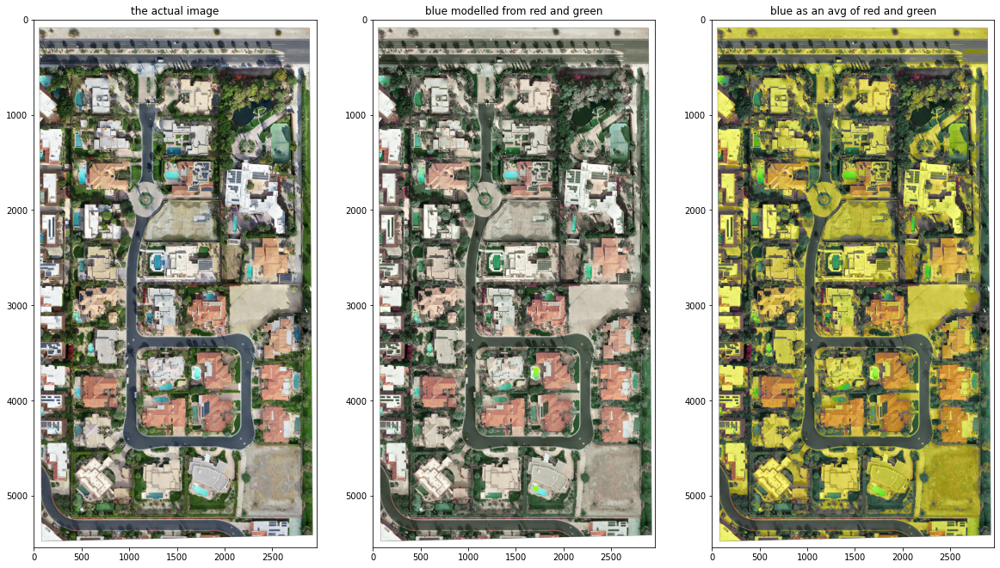

In [26]:
imageRGB_model = imageRGB.copy()
imageRGB_model[:,:,2] = imageB_model

imageRGB_naive = imageRGB.copy()
#lets try... blue as the average of red and green...
imageRGB_naive[:,:,2] = (imageRGB[:,:,1] + imageRGB[:,:,0])//2

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGB);axs[0].set_title('the actual image')
axs[1].imshow(imageRGB_model);axs[1].set_title('blue modelled from red and green')
axs[2].imshow(imageRGB_naive);axs[2].set_title('blue as an avg of red and green')

In [0]:
def applyBlueModel(inRGB, blueModel):

  inRGB_flat = inRGB.reshape(-1, inRGB.shape[-1])

  inRG_flat = inRGB_flat[:,0:2]

  outB_flat_model = blueModel.predict(inRG_flat)

  outB_model = outB_flat_model.reshape(inRGB.shape[0:2])

  outRGB = inRGB.copy()
  outRGB[:,:,2] = outB_model

  return outRGB

Text(0.5, 1.0, 'modelled 2')

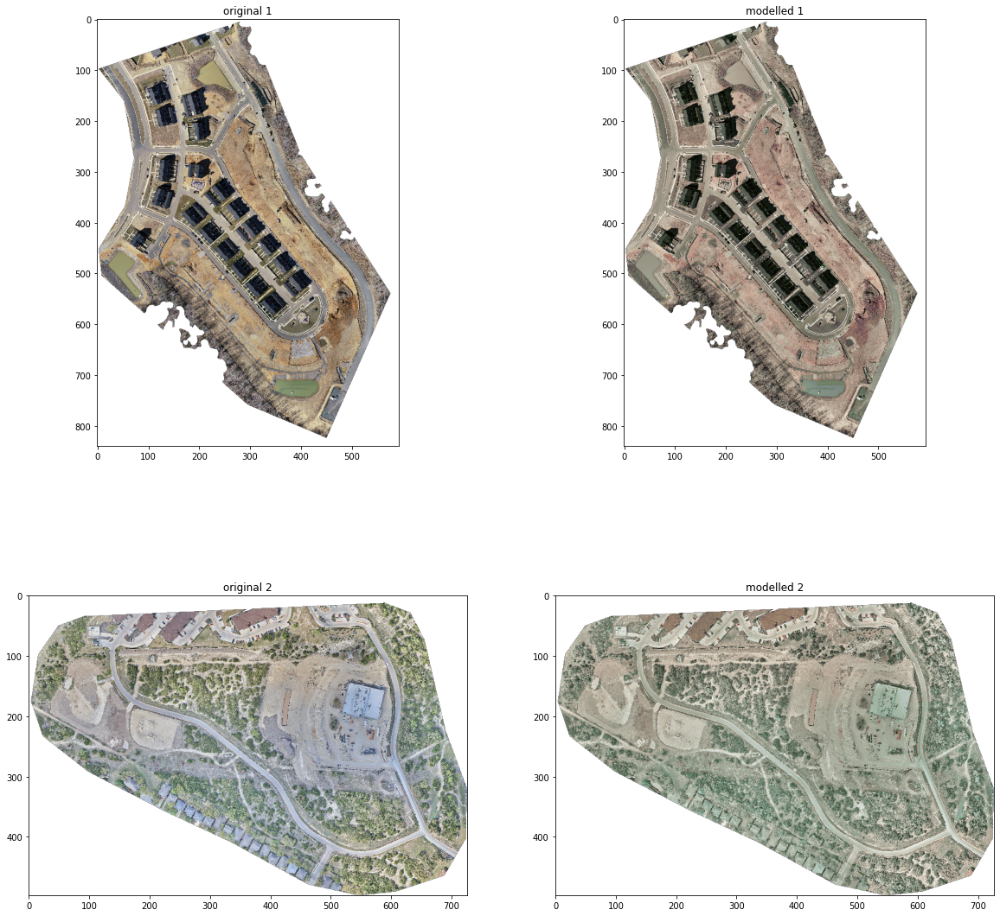

In [29]:
imageRGB_2 = imageio.imread(imageInfo.iloc[2].path_image)[::10,::10]
imageRGB_2_model = applyBlueModel(imageRGB_2, blueModel)

imageRGB_1 = imageio.imread(imageInfo.iloc[1].path_image)[::10,::10]
imageRGB_1_model = applyBlueModel(imageRGB_1, blueModel)

fig, axs = plt.subplots(2, 2)
axs[0,0].imshow(imageRGB_1);axs[0,0].set_title('original 1')
axs[0,1].imshow(imageRGB_1_model);axs[0,1].set_title('modelled 1')
axs[1,0].imshow(imageRGB_2);axs[1,0].set_title('original 2')
axs[1,1].imshow(imageRGB_2_model);axs[1,1].set_title('modelled 2')

In [30]:
import numpy as np 

reduction = 10
imagelabel = imageio.imread(imageInfo.iloc[0].path_label)[::reduction,::reduction,:]
imagelabel.shape

(555, 297, 3)

In [0]:
lut_rgb = {(255, 0, 255) : 0,
        (230, 25, 75) : 1,
        (145, 30, 180) : 2,
        (60, 180, 75) : 3,
        (245, 130,48) : 4,
        (255, 255, 255) : 5,
        (0,130,200) : 6}

def rgb2label(rgb_array):
  def indexLUT(rgb_array):
    return lut_rgb[tuple(rgb_array)]
  label_array = np.apply_along_axis(indexLUT, 2, rgb_array)
  return label_array

In [32]:
imagelabel_value = rgb2label(imagelabel)
imagelabel_value.shape

(555, 297)

In [0]:
lut_label =np.array([[255, 0, 255],
      [230, 25, 75],
      [145, 30, 180],
      [60, 180, 75],
      [245, 130,48],
      [255, 255, 255],
      [0,130,200]])

def label2rgb(label_array):
  rgb_array = np.zeros(label_array.shape + (3,), dtype=np.uint8)
  rgb_array = np.take(lut_label, label_array, axis=0, out=rgb_array)

  return rgb_array

In [0]:
class_names = ['IGNORE', 'BUILDING', 'CLUTTER', 'VEGETATION', 'WATER', 'GROUND', 'CAR']

In [36]:
imagelabel_test = label2rgb(imagelabel_value)
imagelabel_test.shape

(555, 297, 3)

Text(0.5, 1.0, 'reconstructed RGB label test')

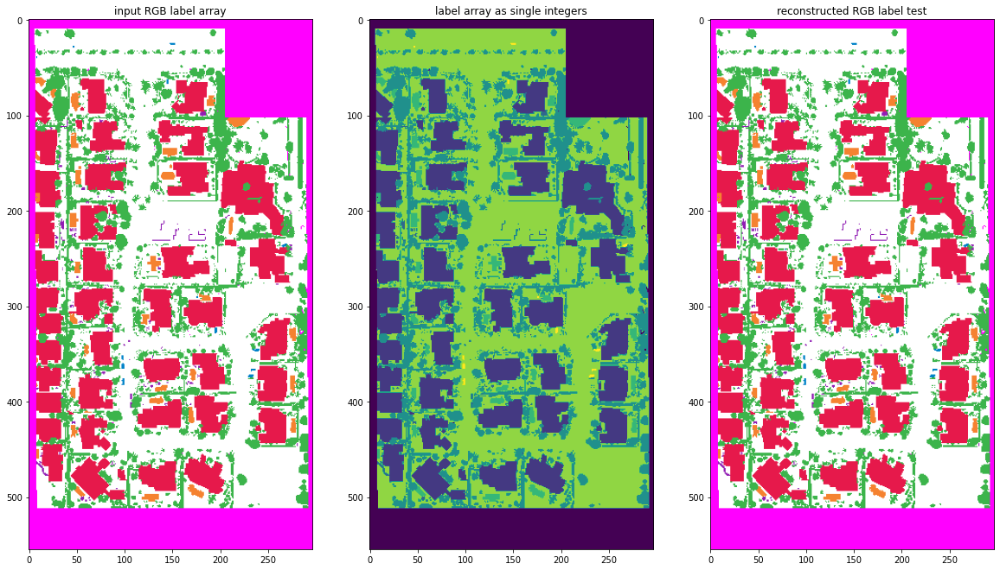

In [37]:
fig, axs = plt.subplots(1, 3)
axs[0].imshow(imagelabel);axs[0].set_title('input RGB label array')
axs[1].imshow(imagelabel_value);axs[1].set_title('label array as single integers')
axs[2].imshow(imagelabel_test);axs[2].set_title('reconstructed RGB label test')

In [38]:
imageRGBA = imageio.imread(imageInfo.iloc[0].path_image)[::reduction,::reduction,:]
imageRGB = imageRGBA[:,:,0:3]
imageRGB_flat = imageRGB.reshape(-1, imageRGB.shape[-1])

imagelabel_value_flat = imagelabel_value.flatten()

imageRGB_flat_subsample = imageRGB_flat[::100]
imagelabel_value_flat_subsample = imagelabel_value_flat[::100]

print(imageRGB_flat.shape)
print(imagelabel_value_flat.shape)

(164835, 3)
(164835,)


In [0]:
def ourClassifer(examples,targets, dropclass = 0):
  dropMask = targets==dropclass
  targets = targets[~dropMask]
  examples = examples[~dropMask,:]

  from sklearn.ensemble import GradientBoostingClassifier
  classModel = GradientBoostingClassifier(n_estimators=1000, learning_rate=0.1,
                                  max_depth=1, random_state=0,verbose=1).fit(examples, targets)
  return classModel

In [40]:
clf = ourClassifer(imageRGB_flat_subsample, imagelabel_value_flat_subsample)

      Iter       Train Loss   Remaining Time 
         1        1476.2301           11.39s
         2        1410.7299            9.46s
         3        1377.0139            8.81s
         4        1349.4638            8.49s
         5        1328.0487            8.32s
         6        1309.2923            8.12s
         7        1292.8467            7.92s
         8        1279.8320            7.76s
         9        1267.8242            7.77s
        10        1257.8234            7.79s
        20        1195.8254            7.04s
        30        1165.1673            7.05s
        40        1142.8452            6.82s
        50        1123.9527            6.64s
        60        1107.7336            6.50s
        70        1093.9957            6.42s
        80        1080.9665            6.31s
        90        1069.8470            6.22s
       100        1059.2294            6.13s
       200         986.2218            5.37s
       300         941.6997            4.66s
       40

Text(0.5, 1.0, 'modeled labels: GBDT Regression (RGB)')

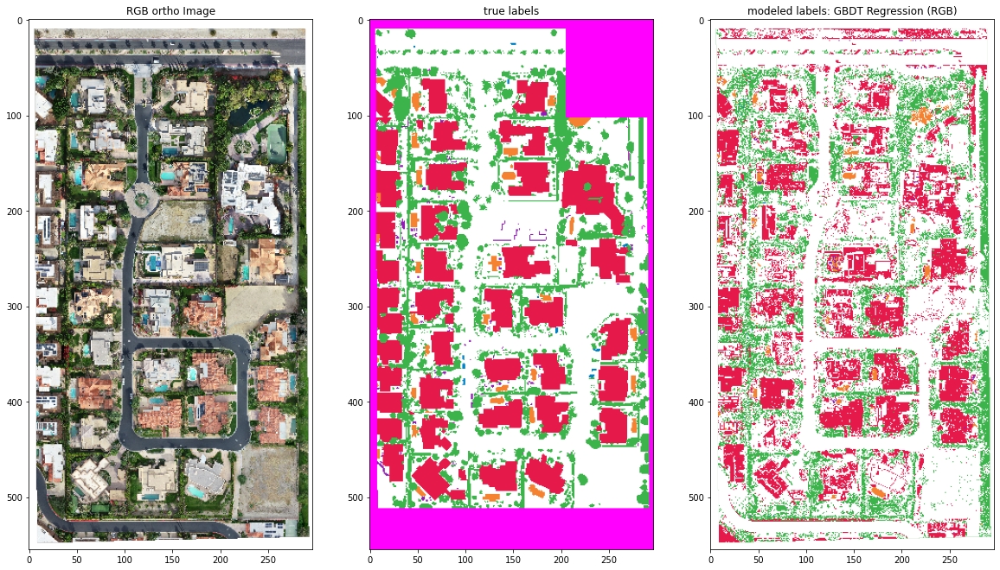

In [41]:
imagelabel_value_flat_model = clf.predict(imageRGB_flat)
plt.rcParams['figure.figsize'] = [20, 20]
inshape = imageRGB.shape
imagelabel_value_model = imagelabel_value_flat_model.reshape(inshape[0:2])
imagelabel_model = label2rgb(imagelabel_value_model)

# we can use the RGBA alpha channel to set the nan area to white in the results
imagelabel_model = np.dstack([imagelabel_model,imageRGBA[:,:,3]]) 

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGBA);axs[0].set_title('RGB ortho Image')
axs[1].imshow(imagelabel);axs[1].set_title('true labels')
axs[2].imshow(imagelabel_model);axs[2].set_title('modeled labels: GBDT Regression (RGB)')

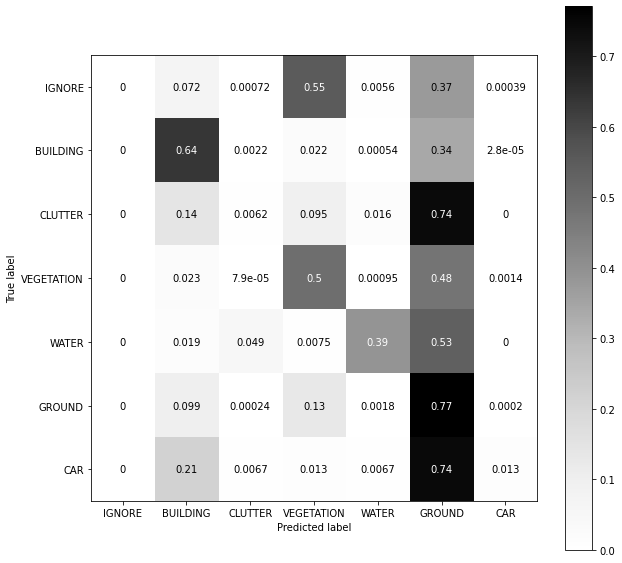

In [42]:
from sklearn.metrics import plot_confusion_matrix
plt.rcParams['figure.figsize'] = [10, 10]  
plot_confusion_matrix(clf, imageRGB_flat, imagelabel_value_flat, display_labels=class_names,cmap='Greys',
                                 normalize='true')
plt.rcParams['figure.figsize'] = [20, 20] 

Text(0.5, 1.0, 'class after subsample')

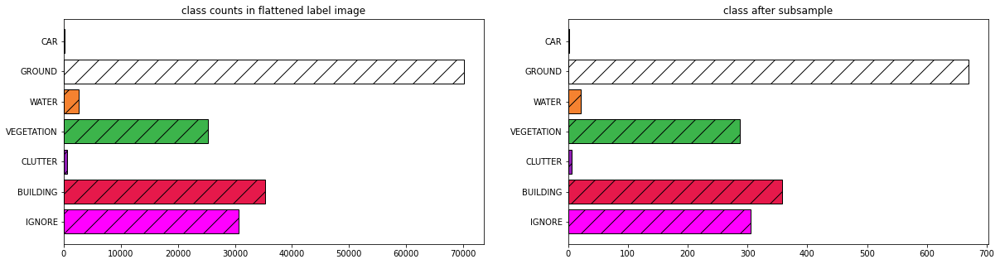

In [43]:
fig, ax = plt.subplots(1,2)
fig.set_figheight(5)

labels, counts = np.unique(imagelabel_value_flat,return_counts=True)
ax[0].barh(labels, counts,edgecolor ='xkcd:black',linewidth =1, color=lut_label/255,hatch="/")
ax[0].set_yticks(np.arange(len(class_names)))
ax[0].set_yticklabels(class_names)
ax[0].set_title('class counts in flattened label image')

labels, counts = np.unique(imagelabel_value_flat_subsample,return_counts=True)
ax[1].barh(labels, counts,edgecolor ='xkcd:black',linewidth =1, color=lut_label/255,hatch="/")
ax[1].set_yticks(np.arange(len(class_names)))
ax[1].set_yticklabels(class_names)
ax[1].set_title('class after subsample')

In [0]:
listOfSamples_RGB = []
listOfSamples_label = []
reduction = 50 
count = 750

for label in labels: # bit sloppy but 'labels' is avilable from our plots above
  labelSubset = imagelabel_value_flat[::reduction][imagelabel_value_flat[::reduction]==label][:count]
  listOfSamples_label.append(labelSubset)
  featureSubset = imageRGB_flat[::reduction][imagelabel_value_flat[::reduction]==label,:][:count,:]
  listOfSamples_RGB.append(featureSubset)

imageRGB_flat_subsample2 = np.vstack(listOfSamples_RGB)
imagelabel_value_flat_subsample2 = np.hstack(listOfSamples_label)

Text(0.5, 1.0, 'class counts after new subsample')

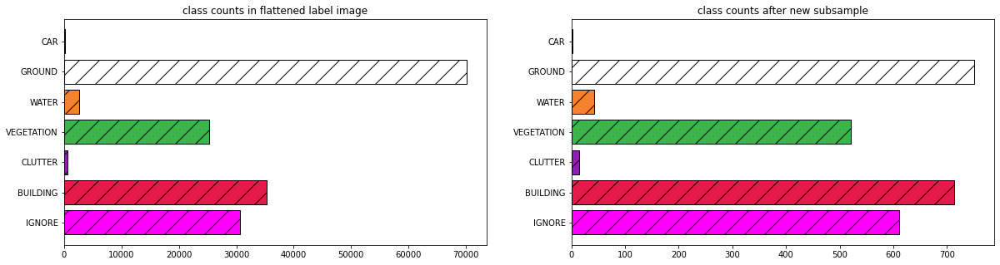

In [45]:
fig, ax = plt.subplots(1,2)
fig.set_figheight(5)

labels, counts = np.unique(imagelabel_value_flat,return_counts=True)
ax[0].barh(labels, counts,edgecolor ='xkcd:black',linewidth =1, color=lut_label/255,hatch="/")
ax[0].set_yticks(np.arange(len(class_names)))
ax[0].set_yticklabels(class_names)
ax[0].set_title('class counts in flattened label image')

labels, counts = np.unique(imagelabel_value_flat_subsample2,return_counts=True)
ax[1].barh(labels, counts,edgecolor ='xkcd:black',linewidth =1, color=lut_label/255,hatch="/")
ax[1].set_yticks(np.arange(len(class_names)))
ax[1].set_yticklabels(class_names)
ax[1].set_title('class counts after new subsample')

In [46]:
clf2 = ourClassifer(imageRGB_flat_subsample2, imagelabel_value_flat_subsample2)

      Iter       Train Loss   Remaining Time 
         1        2394.8787           15.20s
         2        2299.8111           11.91s
         3        2240.4057           10.82s
         4        2191.6053           10.27s
         5        2153.7530            9.95s
         6        2117.4072            9.75s
         7        2089.0559            9.78s
         8        2064.0481            9.62s
         9        2043.7753            9.49s
        10        2024.9331            9.39s
        20        1921.0716            8.82s
        30        1872.2242            8.82s
        40        1838.1664            8.57s
        50        1810.8165            8.44s
        60        1786.9975            8.34s
        70        1766.0941            8.22s
        80        1747.2418            8.10s
        90        1729.5240            8.04s
       100        1713.7988            7.92s
       200        1602.9184            6.93s
       300        1540.5966            6.04s
       40

Text(0.5, 1.0, 'modeled labels: GBDT Regression (RGB)- select subsample')

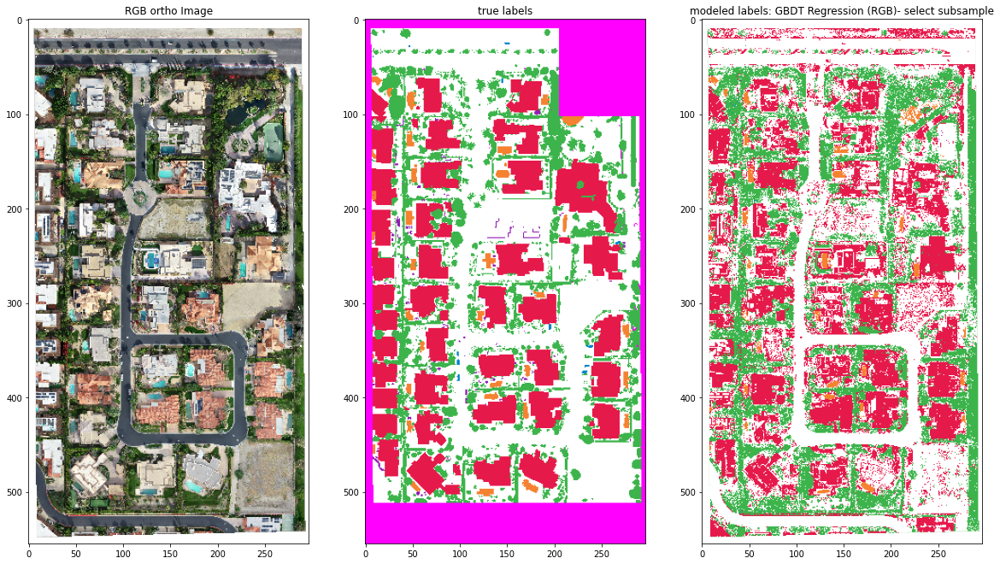

In [47]:
imagelabel_value_flat_model = clf2.predict(imageRGB_flat)

inshape = imageRGB.shape
imagelabel_value_model = imagelabel_value_flat_model.reshape(inshape[0:2])
imagelabel_model = label2rgb(imagelabel_value_model)
imagelabel_model = np.dstack([imagelabel_model, imageRGBA[:,:,3]]) #again, for the alpha channel

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGBA);axs[0].set_title('RGB ortho Image')
axs[1].imshow(imagelabel);axs[1].set_title('true labels')
axs[2].imshow(imagelabel_model);axs[2].set_title('modeled labels: GBDT Regression (RGB)- select subsample')

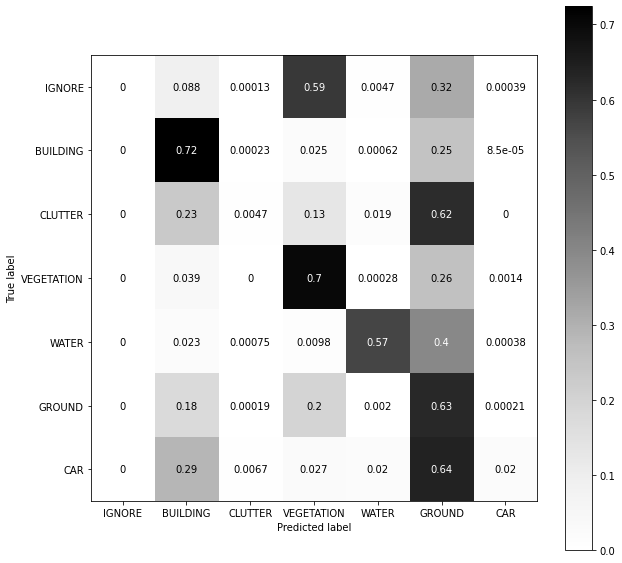

In [48]:
from sklearn.metrics import plot_confusion_matrix
plt.rcParams['figure.figsize'] = [10, 10] 
plot_confusion_matrix(clf2, imageRGB_flat, imagelabel_value_flat, display_labels=class_names,cmap='Greys',
                                 normalize='true')
plt.rcParams['figure.figsize'] = [20, 20] 

In [49]:
reduction=10
elevation32 = imageio.imread(imageInfo.iloc[0].path_elevation)[::reduction,::reduction]
print(elevation32[0,0])

-32767.0


In [0]:
elevation32_nan = elevation32.copy()
elevation32_nan[elevation32_nan==-32767.0] = np.nan

Text(0.5, 1.0, 'reconstructed RGB label test')

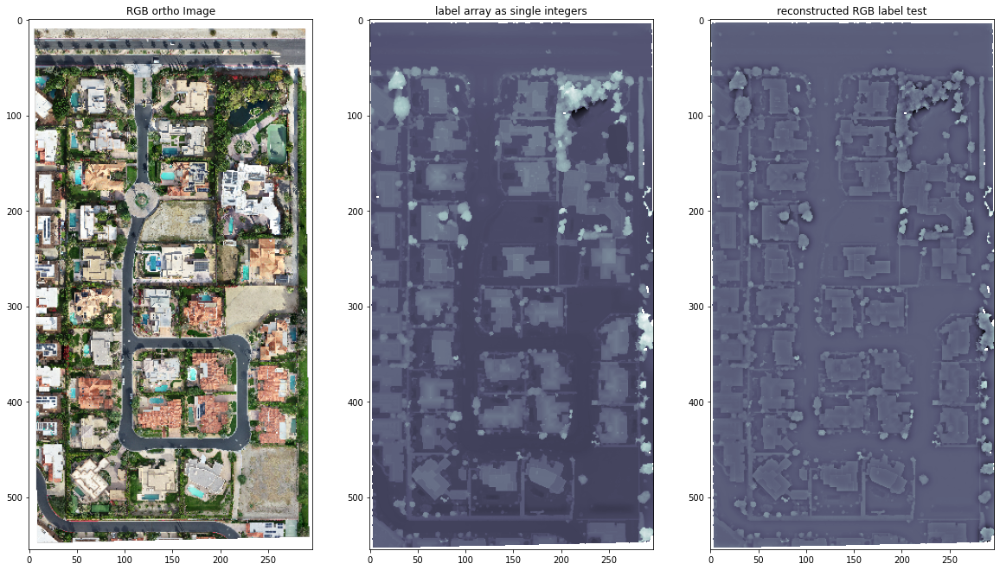

In [51]:
from astropy.convolution import convolve
from astropy.convolution import Gaussian2DKernel
kernel = Gaussian2DKernel(x_stddev=4)
elevation32_tpi = convolve(elevation32_nan, kernel)
elevation32_tpi -= elevation32_nan
elevation32_tpi = -elevation32_tpi # flip the values for plotting

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGBA);axs[0].set_title('RGB ortho Image')
axs[1].imshow(elevation32_nan, cmap='bone');axs[1].set_title('label array as single integers')
axs[2].imshow(elevation32_tpi, cmap='bone');axs[2].set_title('reconstructed RGB label test')

In [0]:
def float2int(array32):
  array32_norm = array32.copy()
  array32_norm -= np.nanmin(array32_norm)
  array32_norm /= np.nanmax(array32_norm)
  array8 = array32_norm*255
  return array8.astype(np.uint8)

In [54]:
elevation8 = float2int(elevation32_nan)
elevation8_tpi = float2int(elevation32_tpi)

imageRGBE = np.dstack([imageRGB, elevation8,elevation8_tpi])
imageRGBE_flat = imageRGBE.reshape(-1, imageRGBE.shape[-1])

imagelabel_value_flat = imagelabel_value.flatten()

imageRGBE_flat_subsample = imageRGBE_flat[::100]
imagelabel_value_flat_subsample = imagelabel_value_flat[::100]

print(imageRGBE_flat.shape)
print(imagelabel_value_flat.shape)

(164835, 5)
(164835,)


In [55]:
clf3 = ourClassifer(imageRGBE_flat_subsample,imagelabel_value_flat_subsample)

      Iter       Train Loss   Remaining Time 
         1        1397.8793           10.88s
         2        1272.1266            9.64s
         3        1194.3514            8.96s
         4        1129.9567            8.64s
         5        1079.1959            8.44s
         6        1034.6406            8.31s
         7         994.5489            8.61s
         8         959.0131            8.61s
         9         928.7862            8.57s
        10         902.2733            8.59s
        20         748.9891            7.98s
        30         683.6565            7.78s
        40         648.4176            7.57s
        50         623.1370            7.47s
        60         603.8349            7.36s
        70         588.9171            7.21s
        80         577.2746            7.08s
        90         566.3230            7.00s
       100         555.9101            6.88s
       200         492.7190            5.98s
       300         453.4965            5.20s
       40

Text(0.5, 1.0, 'modeled labels: GBDT Regression (RGB, Elev. & TPI)')

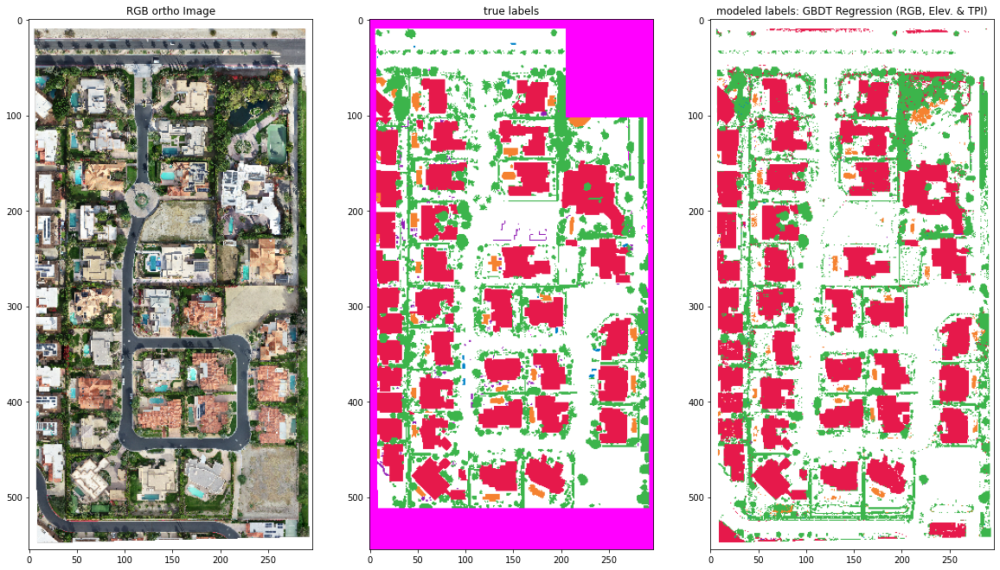

In [56]:
imagelabel_value_flat_model_elevation = clf3.predict(imageRGBE_flat)

inshape = imageRGB.shape
imagelabel_value_model_elevation = imagelabel_value_flat_model_elevation.reshape(inshape[0:2])
imagelabel_model_elevation = label2rgb(imagelabel_value_model_elevation)
imagelabel_model_elevation = np.dstack([imagelabel_model_elevation,imageRGBA[:,:,3]])

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGBA);axs[0].set_title('RGB ortho Image')
axs[1].imshow(imagelabel);axs[1].set_title('true labels')
axs[2].imshow(imagelabel_model_elevation);axs[2].set_title('modeled labels: GBDT Regression (RGB, Elev. & TPI)')

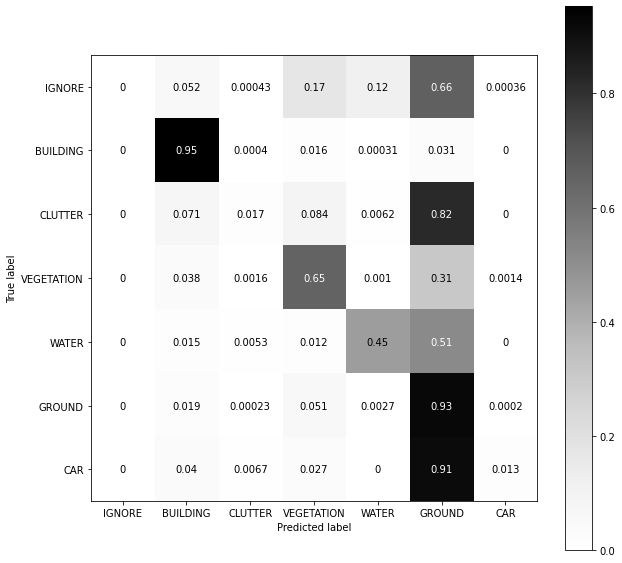

In [57]:

from sklearn.metrics import plot_confusion_matrix
plt.rcParams['figure.figsize'] = [10, 10] #lets reduce the plot size a little 
plot_confusion_matrix(clf3, imageRGBE_flat, imagelabel_value_flat, display_labels=class_names,cmap='Greys',
                                 normalize='true')
plt.rcParams['figure.figsize'] = [20, 20] #bump that plot size back up

Text(0.5, 1.0, 'modeled labels: GBDT Regression (RGB, Elev. & TPI) - filtered')

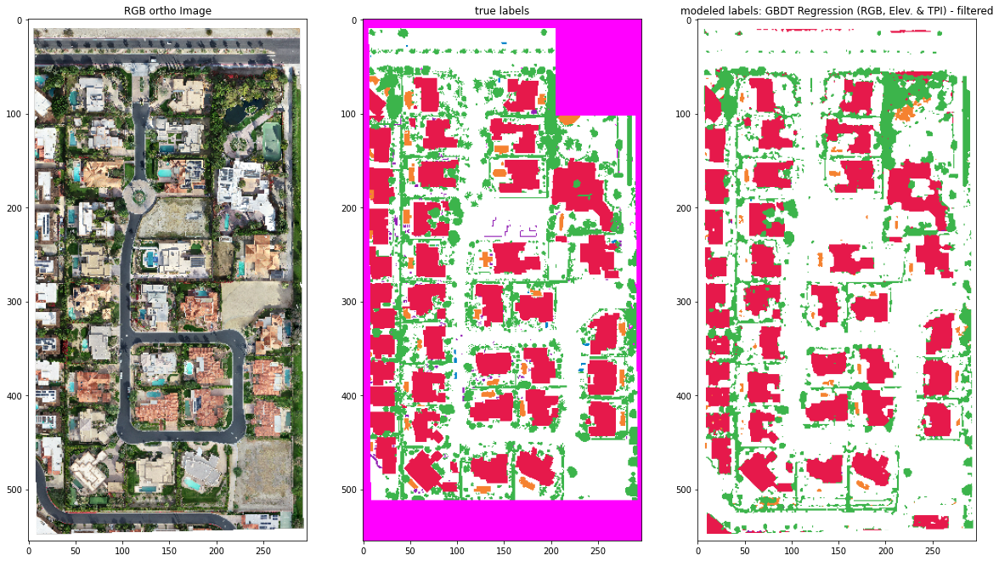

In [58]:
plt.rcParams['figure.figsize'] = [20, 20]

from scipy import ndimage
imagelabel_value_model_elevation_median = ndimage.median_filter(imagelabel_value_model_elevation, size=2)
imagelabel_model_elevation_median = label2rgb(imagelabel_value_model_elevation_median)
imagelabel_model_elevation_median = np.dstack([imagelabel_model_elevation_median,imageRGBA[:,:,3]])

fig, axs = plt.subplots(1, 3)
axs[0].imshow(imageRGBA);axs[0].set_title('RGB ortho Image')
axs[1].imshow(imagelabel);axs[1].set_title('true labels')
axs[2].imshow(imagelabel_model_elevation_median);axs[2].set_title('modeled labels: GBDT Regression (RGB, Elev. & TPI) - filtered')